In [1]:
import time
from collections import defaultdict

import gymnasium as gym
import numpy as np
import random

from matplotlib import pyplot as plt, animation

In [2]:
# 声明Env
env = gym.make('Taxi-v3', render_mode='rgb_array')

In [3]:
gamma = 0.99

# 计算state维度
taxi_row = 24
taxi_col = 24
passenger_location = 4
destination = 3
total_count = ((taxi_row * 5 + taxi_col) * 5 + passenger_location) * 4 + destination

# 声明Q_table
Q_table = np.zeros((total_count, 6))

# 学习率
alpha = 0.9
# 折扣因子
gamma = 0.95

In [4]:
# 训练次数
episode = 1000

# SARSA版本

In [5]:
# SARSA版本
def policy_SARSA(state, info):
    eps = 0.05
    if random.random() < eps:
        return env.action_space.sample(info["action_mask"])
    else:
        # 获取可以执行的action
        array1 = np.where(info["action_mask"] == 1)[0]
        array2 = np.array(Q_table[state][array1], dtype=int)
        # 获取对应位置的Q_table中的最大值的索引
        array3 = np.where(array2 == np.max(array2))[0]
        # 如果多个同等价值的action，那么随机筛选一个动作
        return array1[np.random.choice(array3)]

In [15]:
# 进行Q_table的训练
for _ in range(episode):
    # trajectory = []
    state, info = env.reset()
    # print(info["action_mask"])
    # a = env.action_space.sample(info["action_mask"])
    action = policy_SARSA(state, info)
    while True:
        state_next, reward, terminated, truncated, info_next = env.step(action)
        # plt.imshow(env.render())
        # plt.show()
        action_next = policy_SARSA(state_next, info_next)

        Q_old = Q_table[state][action]
        Q_new = gamma * Q_table[state_next][action_next] + reward

        # 防止错误路径依赖
        # Q_new = gamma * Q_table[state_next][np.argmax(Q_table[state_next][np.where(info_next["action_mask"] == 1)[0]])] + reward
        Q_table[state][action] = alpha * (Q_new - Q_old) + Q_old

        if terminated or truncated:
            break

        state = state_next
        info = info_next
        action = action_next


# 下面进行验证

In [16]:
frames = []
# 画图方法
def draw():
    rgb = env.render()
    plt.imshow(rgb)
    frames.append(rgb)
    plt.show()
    time.sleep(1)


In [17]:
# 生成gif图方法

def display_frames_as_gif(filename,frames):
    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=5)
    anim.save(filename, writer='imagemagick', fps=10)



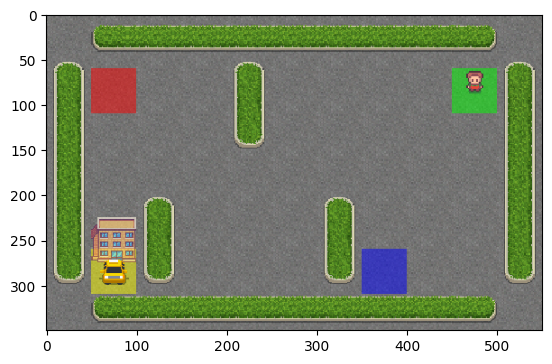

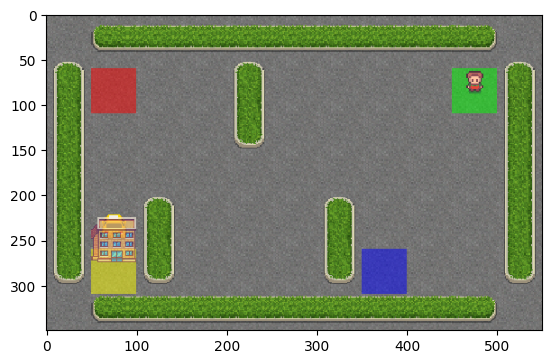

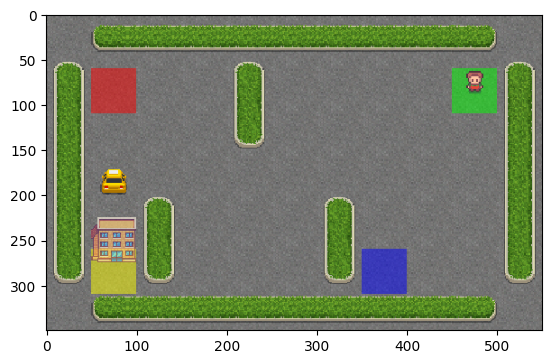

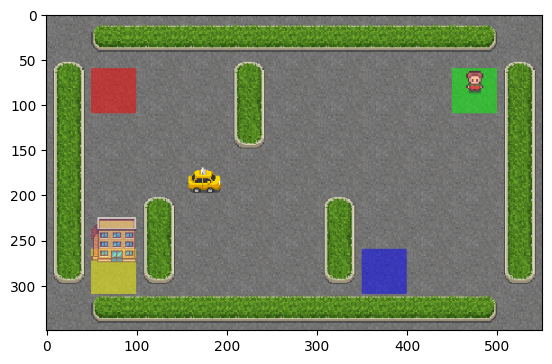

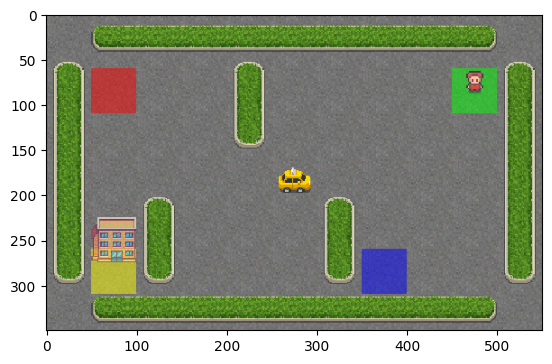

...

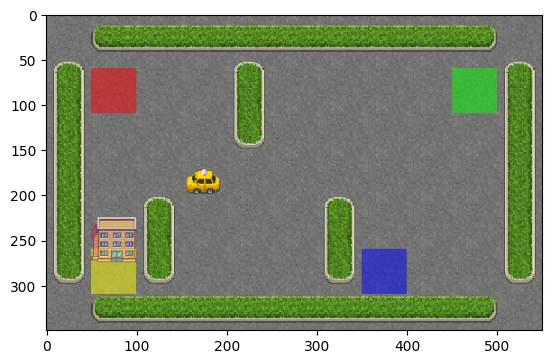

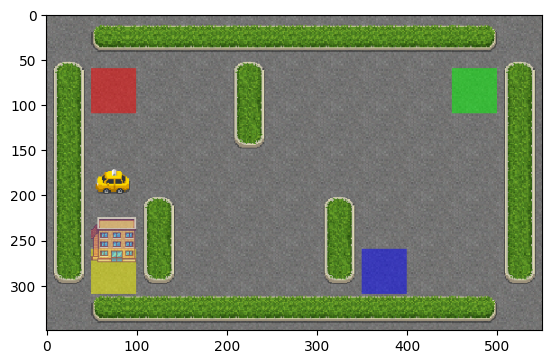

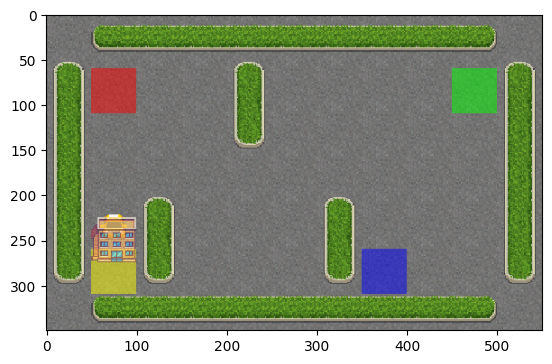

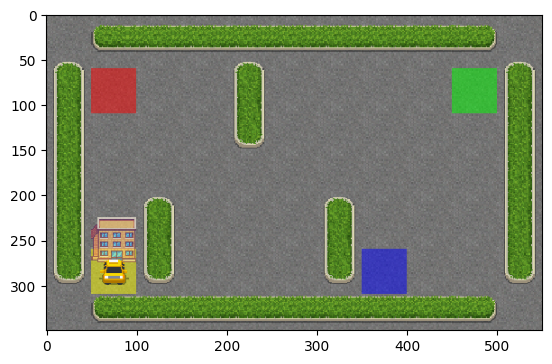

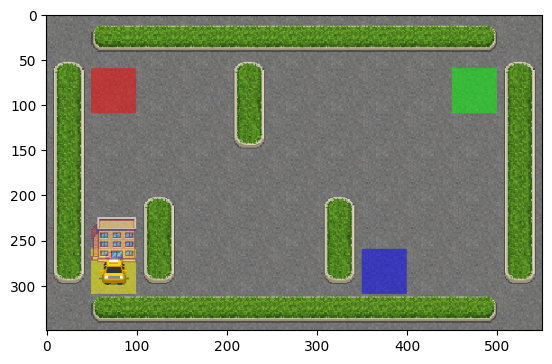

MovieWriter imagemagick unavailable; using Pillow instead.


finished!


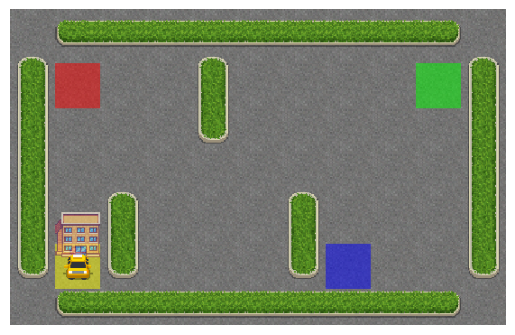

In [18]:
# 验证
env.reset()
while True:
    action = policy_SARSA(state, info)
    state, reward, terminated, truncated, info = env.step(action)
    draw()
    if terminated or truncated:
        print("finished!")
        break
display_frames_as_gif("test2.gif",frames)
env.close()

# 总结
这里计算下来小车会在每一个(x,y)坐标的位置获取一个他最应该做的值，那么最终的效果就是在每一个格子上都有一个固定的流程
如果流程对了，那么就增强q值，如果流程错了削减q值

# Double Q Learning

In [27]:
# 声明两个Q_table
Q_table1 = np.zeros((total_count, 6))
Q_table2 = np.zeros((total_count, 6))

### $\epsilon$ 为概率值，选择以下两个动作
* 选择Q1+Q2中的最高Q值的动作，如果Q值相同的情况下，采用随机抽样的方式
* 随机生成一个动作

In [28]:
def policy_Double_Q_learning(state, info):
    eps = 0.05
    if random.random() < eps:
        return env.action_space.sample(info["action_mask"])
    else:
        # 获取可以执行的action
        action_index = np.where(info["action_mask"] == 1)[0]
        Q_table_sum = np.add(Q_table1[state], Q_table2[state])
        action = 0
        max_sum = float('-inf')
        # 获取Q_table1+Q_table2中的最大值对应的action
        for index in action_index:
            if Q_table_sum[index] > max_sum:
                max_sum = Q_table_sum[index]
                action = index
        return action

In [32]:
def update_Q_table(table1,table2):
    Q_old = table1[state][action]
    action_list = np.where(info_next["action_mask"] == 1)[0]
    max_index = 0
    max_value = float('-inf')
    for i in action_list:
        if table2[state_next][i] > max_value:
            max_value = table2[state_next][i]
            max_index = i
    
    Q_new = reward + gamma * table1[state_next][max_index]
    table1[state][action] = alpha * (Q_new - Q_old) + Q_old

In [33]:

# 进行Q_table的训练
for _ in range(episode):
    # trajectory = []
    state, info = env.reset()
    # print(info["action_mask"])
    # a = env.action_space.sample(info["action_mask"])
    action = policy_Double_Q_learning(state, info)
    while True:
        state_next, reward, terminated, truncated, info_next = env.step(action)
        # plt.imshow(env.render())
        # plt.show()
        action_next = policy_Double_Q_learning(state_next, info_next)

        if random.random() < 0.5:
           update_Q_table(Q_table1,Q_table2)
        else:
            update_Q_table(Q_table2,Q_table1)
        if terminated or truncated:
            break

        state = state_next
        info = info_next
        action = action_next


# 同理下面进行验证

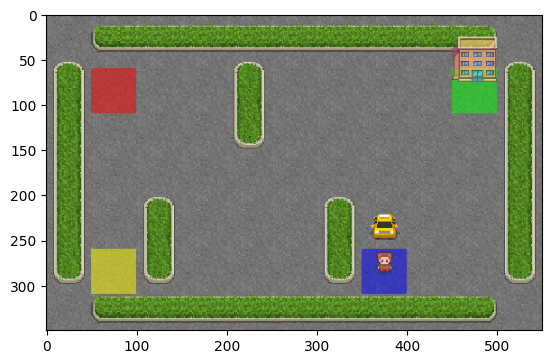

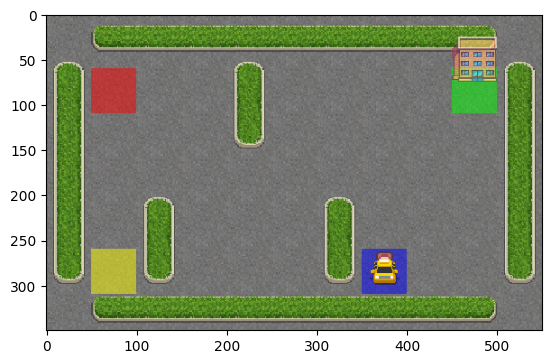

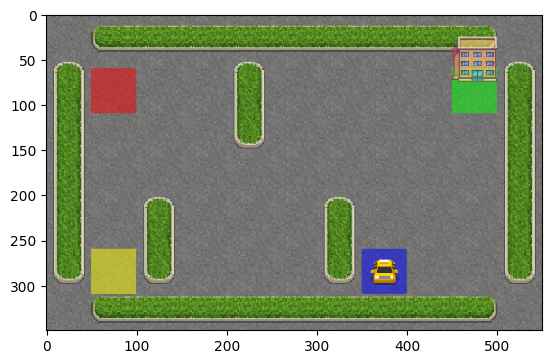

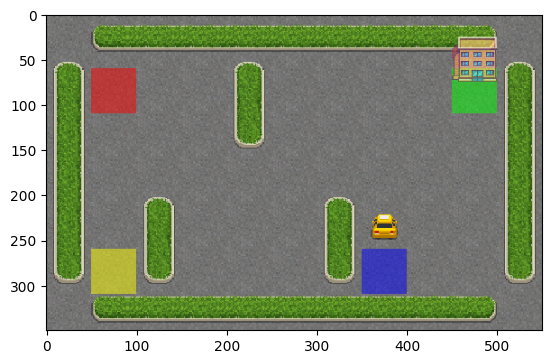

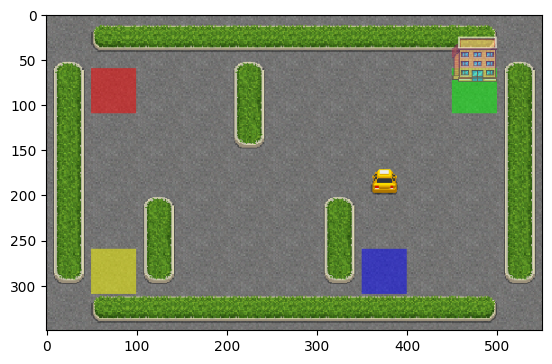

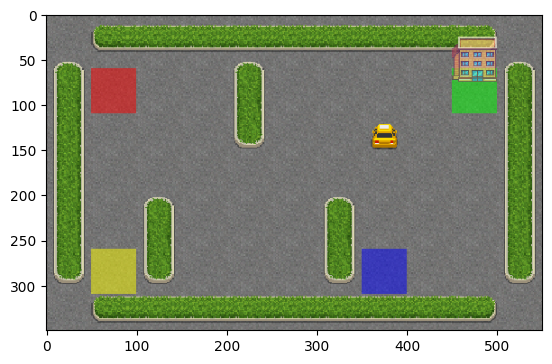

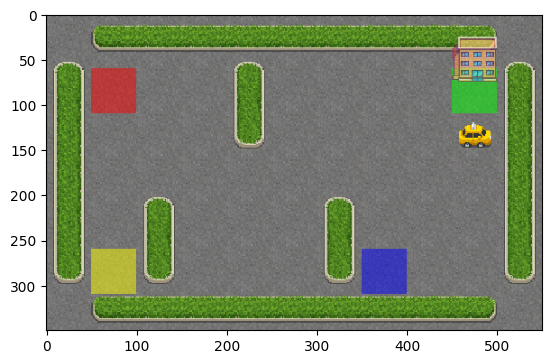

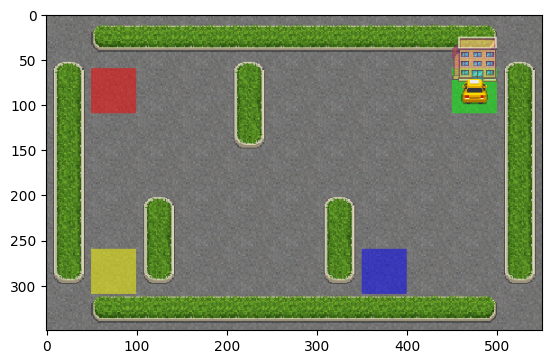

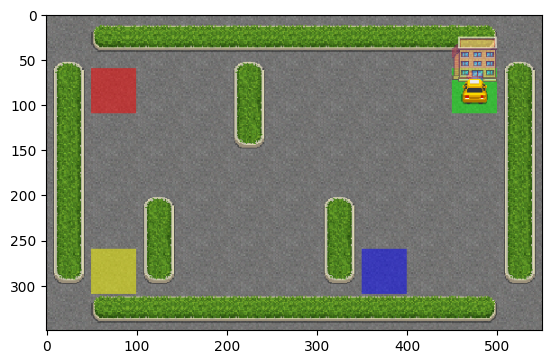

MovieWriter imagemagick unavailable; using Pillow instead.


finished!


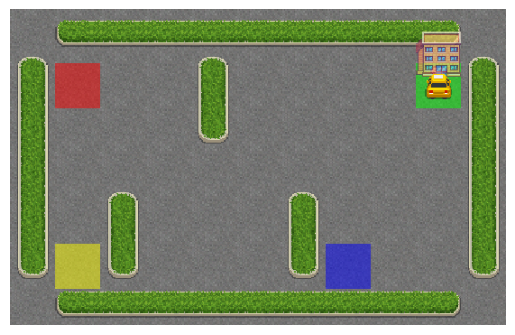

In [34]:
env.reset()
while True:
    action = policy_Double_Q_learning(state, info)
    state, reward, terminated, truncated, info = env.step(action)
    draw()
    if terminated or truncated:
        print("finished!")
        break
display_frames_as_gif("test2.gif",frames)
env.close()